In [1]:
import PIL
from tqdm import tqdm
import numpy as np
import argparse
import cv2
import os
import torch

In [2]:
from interact_tools import SamControler
from tracker.base_tracker import BaseTracker

In [3]:
class TrackingAnything():
    def __init__(self):
        self.samcontroler = SamControler("./sam_checkpoint/sam_vit_h_4b8939.pth", "vit_h", "cpu")
        self.xmem = BaseTracker("./xmem_checkpoint/XMem.pth", device="cpu")
    
    def first_frame_click(self, image: np.ndarray, points:np.ndarray, labels: np.ndarray, multimask=True):
        mask, logit, painted_image = self.samcontroler.first_frame_click(image, points, labels, multimask)
        return mask, logit, painted_image

    def generator(self, images: list, template_mask:np.ndarray):
        masks = []
        logits = []
        painted_images = []
        for i in tqdm(range(len(images)), desc="Tracking image"):
            if i == 0:           
                mask, logit, painted_image = self.xmem.track(images[i], template_mask)
                masks.append(mask)
                logits.append(logit)
                painted_images.append(painted_image)
                
            else:
                mask, logit, painted_image = self.xmem.track(images[i])
                masks.append(mask)
                logits.append(logit)
                painted_images.append(painted_image)
        return masks, logits, painted_images

## Extract frames from video

In [18]:
video_path = '.././dataset/train01.mp4'
output_folder = './frames1'
os.makedirs(output_folder, exist_ok=True)
cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    print("Error: Could not open video.")
    exit()

frame_count = 1

while True:
    ret, frame = cap.read()
    if not ret:
        break
    if frame_count >= 403 and frame_count <= 420:
        frame_filename = os.path.join(output_folder, f'{frame_count}.jpg')
        cv2.imwrite(frame_filename, frame)
        #print(f"Saved frame {frame_count} to {frame_filename}")
    elif frame_count > 420:
        break
    frame_count += 1

cap.release()
print("Video processing complete.")

Video processing complete.


## Load frames

In [19]:
image_folder = './frames1'
file_list = os.listdir(image_folder)

allowed_extensions = ['.jpg']
filtered_files = [f for f in file_list if os.path.splitext(f)[1].lower() in allowed_extensions]
sorted_files = sorted(filtered_files, key=lambda x: int(os.path.splitext(x)[0]))

image_list = []

for file_name in sorted_files:
    file_path = os.path.join(image_folder, file_name)
    img = cv2.imread(file_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if img is not None:
        image_list.append(img)
        #print(f"Successfully loaded {file_name}")
    else:
        print(f"Error loading {file_name}")

print(f"Total images loaded: {len(image_list)}")

Total images loaded: 29


## Prompt points for SAM input

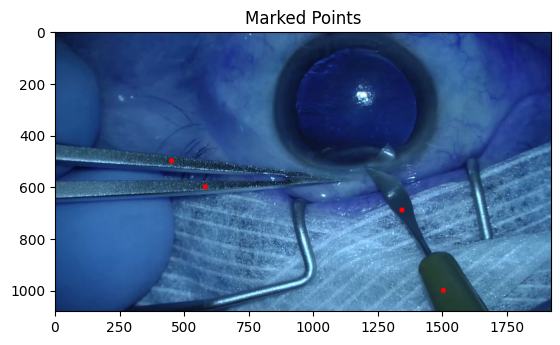

In [6]:
import cv2
import matplotlib.pyplot as plt

image = image_list[0]

points = [(580, 600), (450, 500), (1340, 690), (1500, 1000)]

for point in points:
    cv2.circle(image, point, radius=10, color=(0, 0, 255), thickness=-1)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image_rgb)
plt.title("Marked Points")
plt.axis('on')
plt.show()

## Use SAM to generate first mask for instrument

In [21]:
# TAM for tool 1
ta_1 = TrackingAnything()
points_1 = np.array([[580, 600], [450, 500]])
labels_1 = np.array([1, 1])
mask_1, logit_1, painted_image_1 = ta_1.first_frame_click(image_list[0], points_1, labels_1)

Initializing BaseSegmenter to cpu
Hyperparameters read from the model weights: C^k=64, C^v=512, C^h=64
Single object mode: False


In [22]:
# TAM for tool 2
ta_2 = TrackingAnything()
points_2 = np.array([[1340, 690], [1500, 1000]])
labels_2 = np.array([1, 1])
mask_2, logit_2, painted_image_2 = ta_2.first_frame_click(image_list[0], points_2, labels_2)

Initializing BaseSegmenter to cpu
Hyperparameters read from the model weights: C^k=64, C^v=512, C^h=64
Single object mode: False


### Mask painter for 2 tools

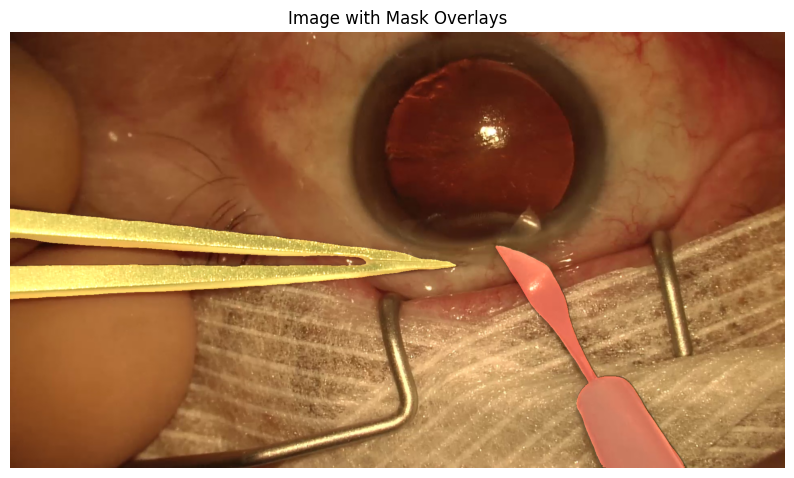

In [40]:
def masked_image_painter(image, mask_1, mask_2):
    color1 = np.array([163, 166, 75])
    color2 = np.array([191, 78, 78])
    
    colored_mask1 = np.zeros_like(image, dtype=np.uint8)
    colored_mask2 = np.zeros_like(image, dtype=np.uint8)

    # Apply colors to the masks where True
    colored_mask1[mask_1] = color1
    colored_mask2[mask_2] = color2
    #plt.imshow(colored_mask1)
    #plt.imshow(colored_mask2)

    combined_image = cv2.addWeighted(image, 1, colored_mask1, 0.8, 0)
    combined_image = cv2.addWeighted(combined_image, 1, colored_mask2, 0.8, 0)

    plt.figure(figsize=(10, 10))
    plt.imshow(combined_image)
    plt.axis('off')
    plt.title('Image with Mask Overlays')
    plt.show()

masked_image_painter(image_list[0], mask_1, mask_2)

## XMem to generate mask of following frames

In [24]:
masks_1, logits_1, painted_images_1 = ta_1.generator(image_list, mask_1)
#masks_2, logits_2, painted_images_2 = ta_2.generator(image_list, mask_2)

Tracking image: 100%|██████████| 29/29 [17:27<00:00, 36.13s/it]


In [26]:
masks_2, logits_2, painted_images_2 = ta_2.generator(image_list, mask_2)

Tracking image: 100%|██████████| 29/29 [16:30<00:00, 34.15s/it]


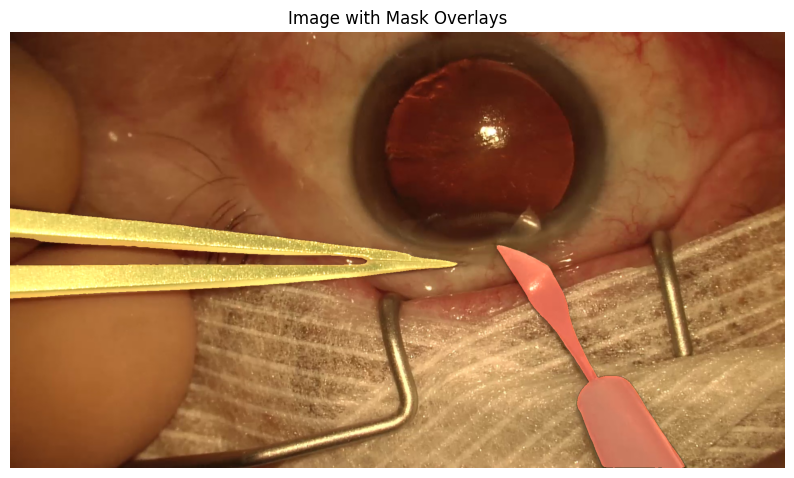

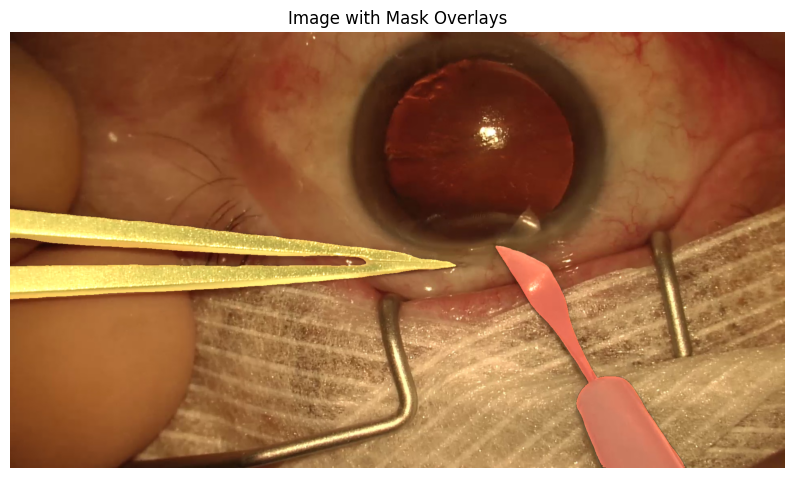

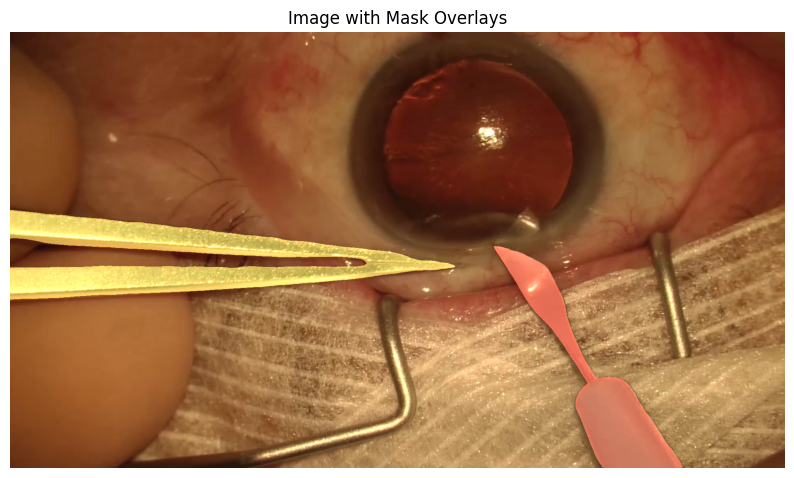

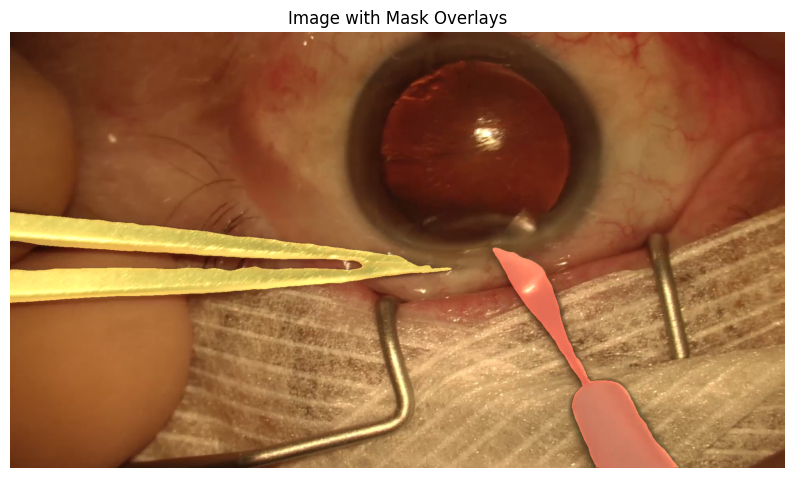

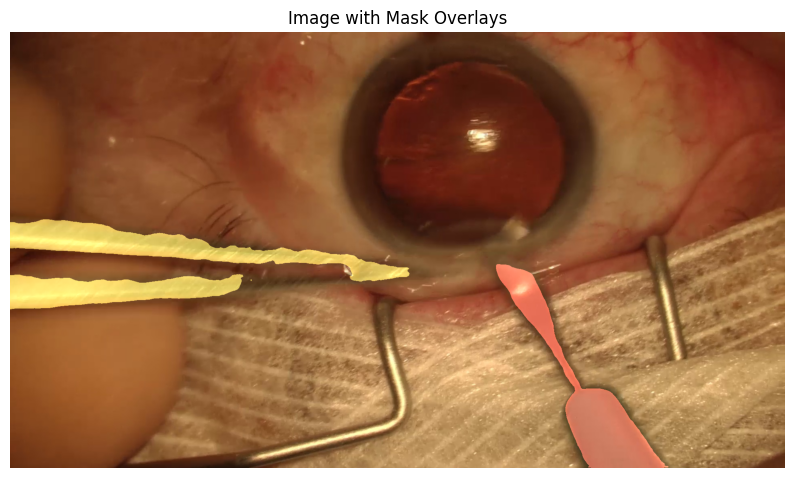

...

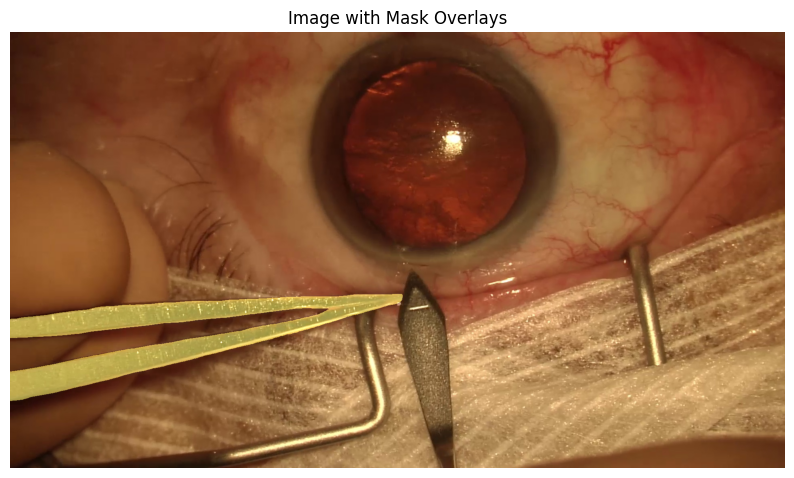

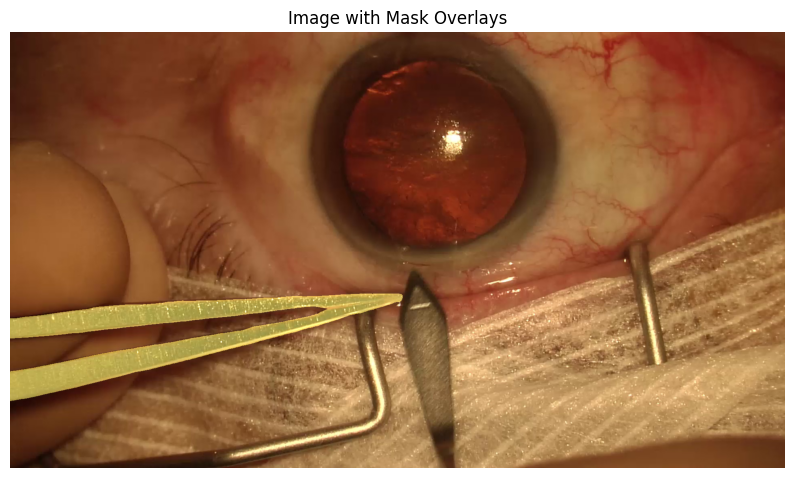

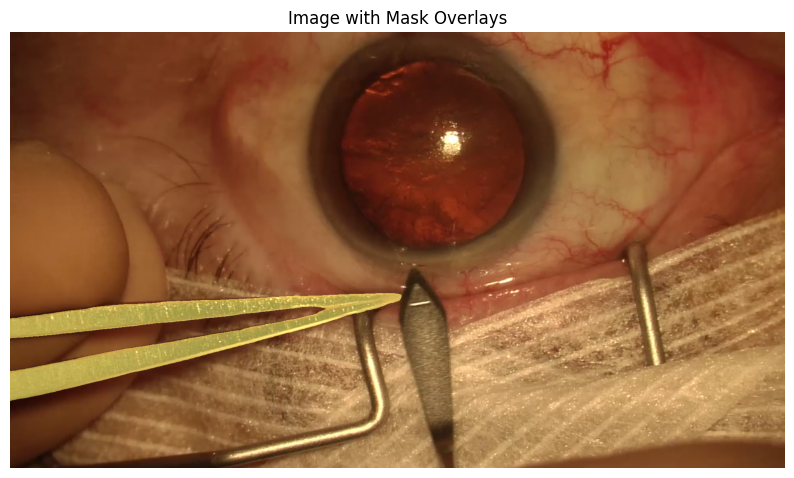

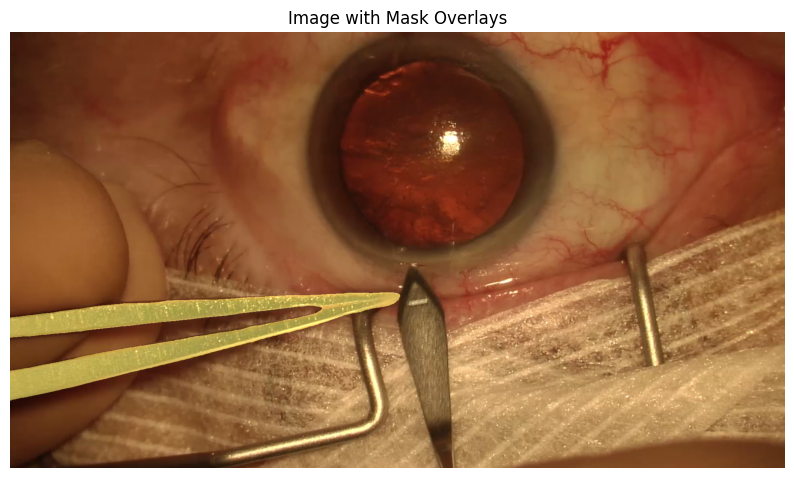

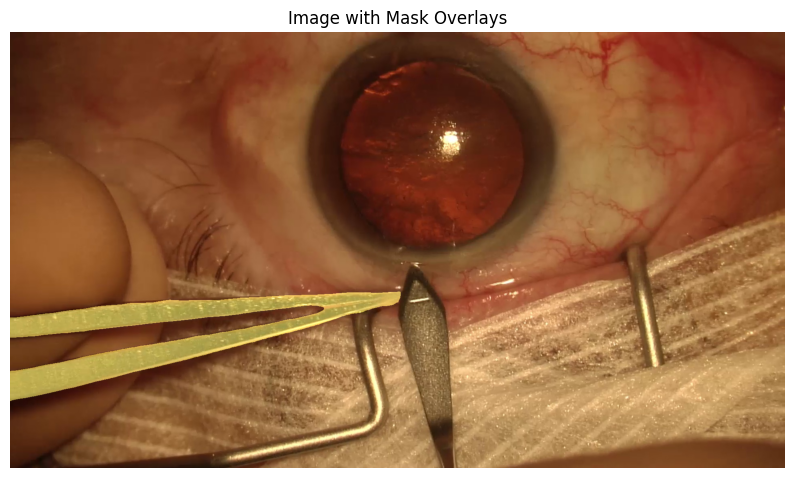

In [46]:
for i in range(11):
    mask_1 = masks_1[i] != 0 # convert it to bool
    mask_2 = masks_2[i] != 0
    masked_image_painter(image_list[i], mask_1, mask_2)
for i in range(11, 29):
    mask_1 = masks_1[i] != 0
    mask_2 = np.zeros_like(mask_1, dtype=np.uint8)
    mask_2 = mask_2 != 0
    masked_image_painter(image_list[i], mask_1, mask_2)